In [1]:
import mldatasets
import pandas as pd
import numpy as np
import math
import re
import nltk
from nltk.probability import FreqDist
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn import metrics, svm
from sklearn.feature_extraction.text import TfidfVectorizer
import lightgbm as lgb
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import lime
import lime.lime_tabular
from lime.lime_text import LimeTextExplainer

In [2]:
nltk.download('stopwords')
nltk.download('punkt')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

[nltk_data] Downloading package stopwords to /Users/serg/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /Users/serg/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [3]:
chocolateratings_df = mldatasets.load("chocolate-bar-ratings")

datasets%2F610579%2F1093011%2Fchocolate.csv: Skipping, found more recently modified local copy (use --force to force download)
1 dataset files found in /Users/serg/EXTEND/PROJECTS/InterpretableMLBook/programming/Chapter6/data folder
parsing /Users/serg/EXTEND/PROJECTS/InterpretableMLBook/programming/Chapter6/data/datasets%2F610579%2F1093011%2Fchocolate.csv


In [4]:
chocolateratings_df

,company,company_location,review_date,country_of_bean_origin,cocoa_percent,rating,counts_of_ingredients,beans,cocoa_butter,vanilla,lecithin,salt,sugar,sweetener_without_sugar,first_taste,second_taste,third_taste,fourth_taste
0,5150,U.S.A,2019,Madagascar,76.0,3.75,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,cocoa,blackberry,full body,NaN
1,5150,U.S.A,2019,Dominican republic,76.0,3.50,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,cocoa,vegetal,savory,NaN
2,5150,U.S.A,2019,Tanzania,76.0,3.25,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,rich cocoa,fatty,bready,NaN
3,A. Morin,France,2012,Peru,63.0,3.75,4,have_bean,have_cocoa_butter,have_not_vanila,have_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,fruity,melon,roasty,NaN
4,A. Morin,France,2012,Bolivia,70.0,3.50,4,have_bean,have_cocoa_butter,have_not_vanila,have_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,vegetal,nutty,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2219,Zotter,Austria,2014,Blend,80.0,2.75,4,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_salt,have_not_sugar,have_sweetener_without_sugar,waxy,cloying,vegetal,NaN
2220,Zotter,Austria,2017,Colombia,75.0,3.75,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,strong nutty,marshmallow,NaN,NaN
2221,Zotter,Austria,2018,Belize,72.0,3.50,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,muted,roasty,accessible,NaN
2222,Zotter,Austria,2018,Congo,70.0,3.25,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,fatty,mild nuts,mild fruit,NaN


In [5]:
tastes_df = chocolateratings_df[['first_taste', 'second_taste', 'third_taste', 'fourth_taste']]
chocolateratings_df = chocolateratings_df.\
                    drop(['first_taste', 'second_taste', 'third_taste', 'fourth_taste'], axis=1)
tastes_df.head(90).tail(10)

,first_taste,second_taste,third_taste,fourth_taste
80,oily,vegetal,nutty,cocoa
81,oily,vanilla,melon,cocoa
82,rich,sour,mild smoke,NaN
83,fruity,sour,NaN,NaN
84,high roast,high astringnet,NaN,NaN
85,smokey,savory,NaN,NaN
86,sandy,roasty,nutty,NaN
87,roasty,brownie,nutty,NaN
88,red wine,rich cocoa,long,NaN
89,creamy,fruit,cocoa,NaN


In [6]:
chocolateratings_df = mldatasets.make_dummies_with_limits(chocolateratings_df,\
                                        'company_location', 0.03333)
chocolateratings_df = mldatasets.make_dummies_with_limits(chocolateratings_df,\
                                        'country_of_bean_origin', 0.03333)

In [7]:
chocolateratings_df = chocolateratings_df.\
                                drop(['beans'], axis=1)
binary_features = ['cocoa_butter', 'vanilla', 'lecithin', 'salt',\
                   'sugar', 'sweetener_without_sugar']
chocolateratings_df[binary_features] =\
    chocolateratings_df[binary_features].\
        apply(lambda x: np.where(x.str.contains('_not_'), 0, 1))

In [8]:
stop = stopwords.words('english')

In [9]:
trans_dict = {'?':'', '&':'', 'overly intense':'intensest',\
              'overly sweet':'sweetest', 'overly tart':'tartest',\
              'sl. bitter':'bitterness', 'sl. burnt':'burntness',\
              'sl. sweet':'sweetness', 'sl. dry':'dryness',\
              'sl. chalky':'chalkiness', 'sl. Burnt':'burntness',\
              'hints fruit':'fruitiness', 'hint fruit':'fruitiness',\
              'high acid':'acidic', 'high acidity':'acidic',\
              'moderate acidity':'acid', 'high roast':'roast',\
              'astringcy':'astringent', 'astringnet':'astringent',\
              'full body':'robust', 'astringency':'astringent',\
              'high astringent':'acidic', 'rich cocoa':'rich',\
              'mild bitter':'bitterish', 'fruit long':'fruit',\
              'base cocoa':'basic', 'basic cocoa':'basic', '-like':'',\
              'smomkey':'smokey', 'true':'real', '(n)':'', '/':' ',\
              '-':' ', ' +':' ' }
trans_regex = re.compile("|".join(map(re.escape, trans_dict.keys( ))))

In [10]:
tastes_s = tastes_df.replace(np.nan, '', regex=True).\
            agg(' '.join, axis=1).str.strip().str.lower().\
            apply(lambda s: trans_regex.sub(lambda match:\
                                trans_dict[match.group(0)], s)).\
            apply(lambda s: ' '.join([word for word in s.split()\
                                      if word not in (stop)]))

In [11]:
print(tastes_s)

0          cocoa blackberry robust
1             cocoa vegetal savory
2                rich fatty bready
3              fruity melon roasty
4                    vegetal nutty
                   ...            
2219          waxy cloying vegetal
2220      strong nutty marshmallow
2221       muted roasty accessible
2222    fatty mild nuts mild fruit
2223            fatty earthy cocoa
Length: 2224, dtype: object


In [12]:
print(np.unique(tastes_s).shape)

(2178,)


In [13]:
tastewords_fdist = FreqDist(word for word in\
                            word_tokenize(tastes_s.str.cat(sep=' ')))
tastewords_df = pd.DataFrame.from_dict(tastewords_fdist,\
                                       orient='index').\
                                rename(columns={0:'freq'})
commontastes_l = tastewords_df[tastewords_df.freq > 74].index.to_list()
commontastes_l

['cocoa',
 'rich',
 'fatty',
 'roasty',
 'nutty',
 'sweet',
 'sandy',
 'sour',
 'intense',
 'mild',
 'fruit',
 'sticky',
 'earthy',
 'spice',
 'molasses',
 'floral',
 'spicy',
 'woody',
 'coffee',
 'berry',
 'vanilla',
 'creamy']

In [14]:
chocolateratings_df['tastes'] = tastes_s
chocolateratings_df = mldatasets.make_dummies_from_dict(chocolateratings_df,\
                                             'tastes', commontastes_l)

In [15]:
chocolateratings_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2224 entries, 0 to 2223
Data columns (total 46 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   company                                    2224 non-null   object 
 1   review_date                                2224 non-null   int64  
 2   cocoa_percent                              2224 non-null   float64
 3   rating                                     2224 non-null   float64
 4   counts_of_ingredients                      2224 non-null   int64  
 5   cocoa_butter                               2224 non-null   int64  
 6   vanilla                                    2224 non-null   int64  
 7   lecithin                                   2224 non-null   int64  
 8   salt                                       2224 non-null   int64  
 9   sugar                                      2224 non-null   int64  
 10  sweetener_without_sugar 

In [16]:
rand = 9
y = chocolateratings_df['rating'].\
                            apply(lambda x: 1 if x >= 3.5 else 0)
X = chocolateratings_df.drop(['rating','company'], axis=1).copy()
X_train, X_test, y_train, y_test = train_test_split(X, y,\
                                test_size=0.33, random_state=rand)

In [17]:
X_train_nlp = tastes_s[X_train.index]
X_test_nlp = tastes_s[X_test.index]

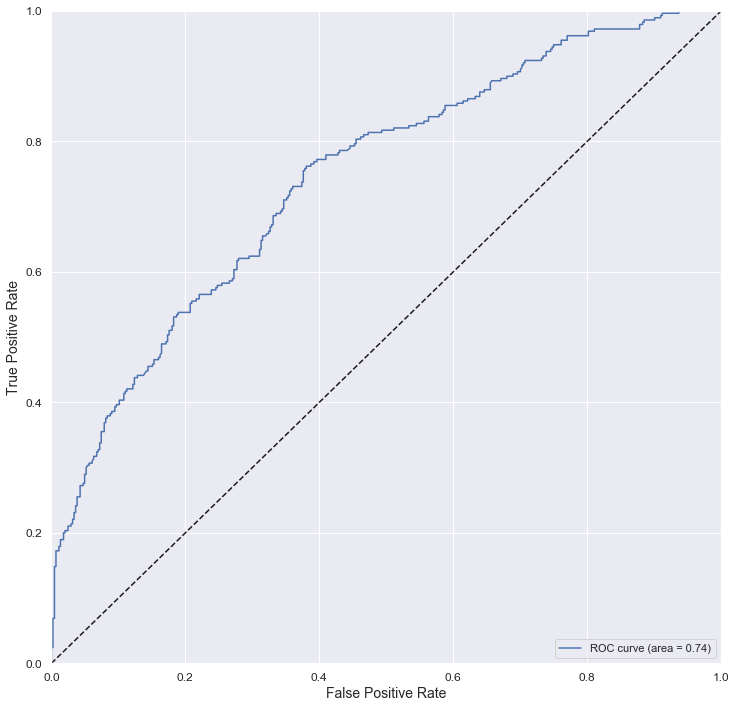

Accuracy_train:  0.7315		Accuracy_test:   0.6962
Precision_test:  0.6772		Recall_test:     0.4414
ROC-AUC_test:    0.7449		F1_test:         0.5344		MCC_test: 0.3399


In [18]:
orig_plt_params = plt.rcParams
sns.set()
svm_mdl = svm.SVC(probability=True, gamma='auto', random_state=rand)
fitted_svm_mdl = svm_mdl.fit(X_train, y_train)
y_train_svc_pred, y_test_svc_prob, y_test_svc_pred =\
        mldatasets.evaluate_class_mdl(fitted_svm_mdl, X_train,\
                                      X_test, y_train, y_test)

In [19]:
svm_mdl.classes_

array([0, 1])

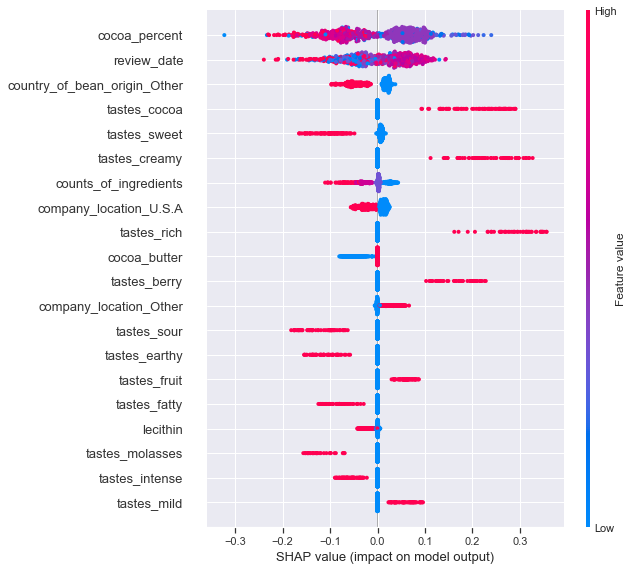

In [20]:
np.random.seed(rand)
X_train_summary = shap.kmeans(X_train, 10)
shap_svm_explainer = shap.KernelExplainer(fitted_svm_mdl.predict_proba,\
                                          X_train_summary)
shap_svm_values_test = shap_svm_explainer.shap_values(X_test,\
                                nsamples=200, l1_reg="num_features(20)")
shap.summary_plot(shap_svm_values_test[1], X_test, plot_type="dot")

In [21]:
sample_test_idx = X_test.index.\
                    get_indexer_for([5,6,7,18,19,21,24,25,27])

In [22]:
expected_value = shap_svm_explainer.expected_value[1]
y_test_shap_pred = (shap_svm_values_test[1].sum(1) + expected_value) > 0.5
print(np.array_equal(y_test_shap_pred, y_test_svc_pred))

True


In [23]:
FN = (~y_test_shap_pred[sample_test_idx]) &\
     (y_test.iloc[sample_test_idx] == 1).to_numpy() 

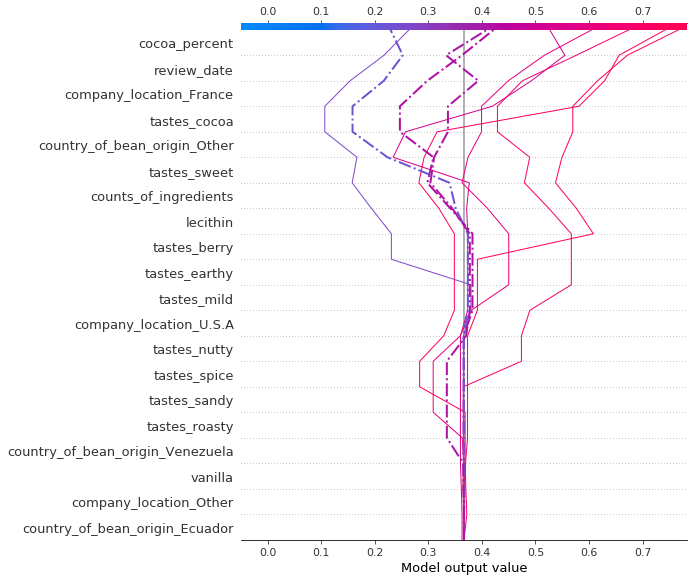

In [24]:
sns.reset_orig()
plt.rcParams.update(orig_plt_params)
shap.decision_plot(expected_value, shap_svm_values_test[1][sample_test_idx],\
                   X_test.iloc[sample_test_idx], highlight=FN)

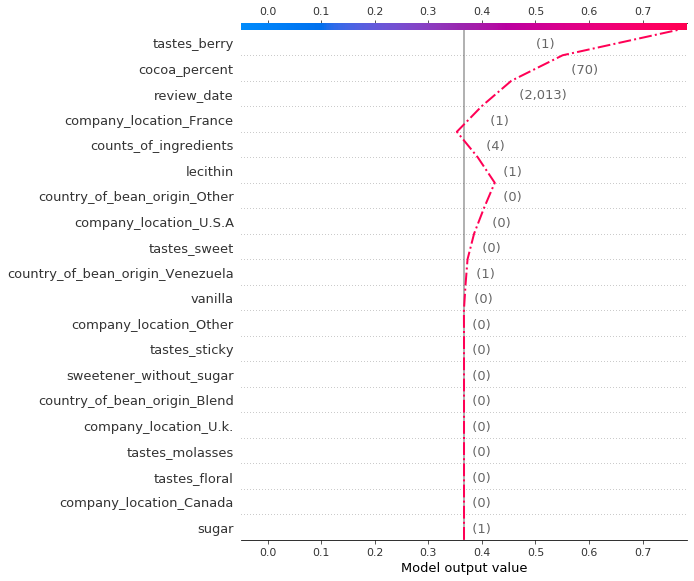

In [25]:
shap.decision_plot(expected_value, shap_svm_values_test[1][696],\
                   X_test.iloc[696], highlight=0)

In [26]:
eval_idxs = (X_test.index==5) | (X_test.index==24)
X_test_eval = X_test[eval_idxs]
eval_compare_df = pd.concat([\
            chocolateratings_df.iloc[X_test[eval_idxs].index].rating,\
            pd.DataFrame({'y':y_test[eval_idxs]}, index=[5,24]),\
            pd.DataFrame({'y_pred':y_test_svc_pred[eval_idxs]},\
                         index=[24,5]),
            X_test_eval], axis=1).transpose()
eval_compare_df

,5,24
rating,4.0,2.75
y,1.0,0.00
y_pred,1.0,0.00
review_date,2013.0,2015.00
cocoa_percent,70.0,70.00
counts_of_ingredients,4.0,4.00
cocoa_butter,1.0,1.00
vanilla,0.0,0.00
lecithin,1.0,1.00
salt,0.0,0.00


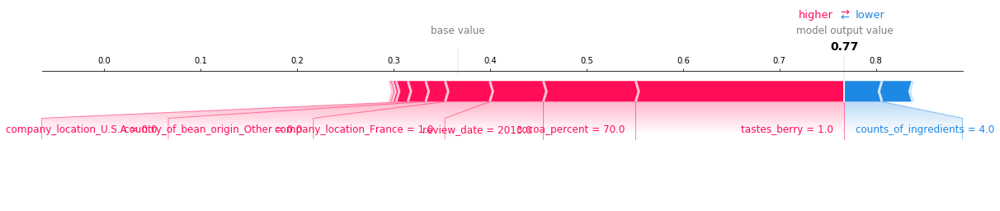

In [27]:
shap.force_plot(expected_value, shap_svm_values_test[1][X_test.index==5],\
                X_test[X_test.index==5],  matplotlib=True)

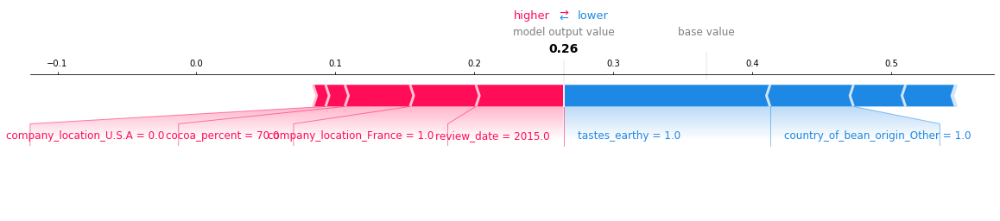

In [28]:
shap.force_plot(expected_value, shap_svm_values_test[1][X_test.index==24],\
                X_test[X_test.index==24], matplotlib=True)

In [29]:
lime_svm_explainer = lime.lime_tabular.LimeTabularExplainer(X_test.values,\
                        feature_names=X_test.columns, categorical_features=list(range(3,44)),\
                        class_names=['Not Highly Recomm.', 'Highly Recomm.'])

In [30]:
lime_svm_explainer.explain_instance(X_test[X_test.index==5].values[0],\
                                    fitted_svm_mdl.predict_proba,\
                                    num_features=8).\
                                show_in_notebook(predict_proba=True)

In [31]:
lime_svm_explainer.explain_instance(X_test[X_test.index==24].values[0],\
                                    fitted_svm_mdl.predict_proba,\
                                    num_features=8).\
                                show_in_notebook(predict_proba=True)

In [32]:
print(X_test_nlp)

1194                 roasty nutty rich
77      roasty oddly sweet marshmallow
121              balanced cherry choco
411                sweet floral yogurt
1259           creamy burnt nuts woody
                     ...              
327          sweet mild molasses bland
1832          intense fruity mild sour
464              roasty sour milk note
2013           nutty fruit sour floral
1190           rich roasty nutty smoke
Length: 734, dtype: object


In [33]:
vectorizer = TfidfVectorizer(lowercase=False)
X_train_nlp_fit = vectorizer.fit_transform(X_train_nlp)
X_test_nlp_fit = vectorizer.transform(X_test_nlp)

In [34]:
pd.DataFrame({'taste':vectorizer.get_feature_names(),\
              'tf-idf': np.asarray(X_test_nlp_fit[X_test_nlp.index==5].todense())[0]}).\
    sort_values(by='tf-idf', ascending=False)

,taste,tf-idf
305,raspberry,0.585538
259,nut,0.491542
265,oily,0.463973
64,caramel,0.447504
274,papaya,0.000000
...,...,...
136,empty,0.000000
135,edge,0.000000
134,easy,0.000000
133,easter,0.000000


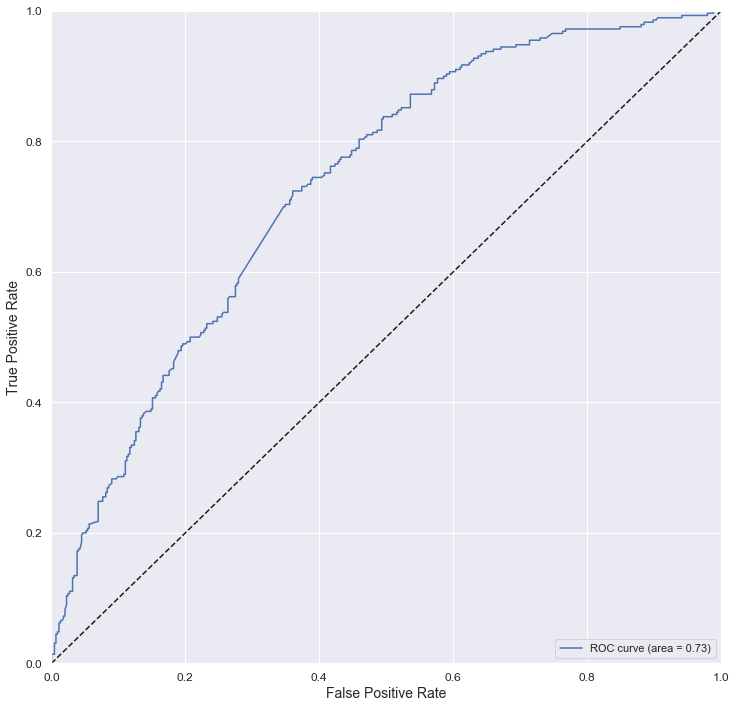

Accuracy_train:  0.7953		Accuracy_test:   0.6798
Precision_test:  0.6233		Recall_test:     0.4793
ROC-AUC_test:    0.7328		F1_test:         0.5419		MCC_test: 0.3084


In [35]:
sns.set()
lgb_mdl = lgb.LGBMClassifier(max_depth=13, learning_rate=0.05,\
            n_estimators=100, objective='binary', random_state=rand)
fitted_lgb_mdl = lgb_mdl.fit(X_train_nlp_fit, y_train)
y_train_lgb_pred, y_test_lgb_prob, y_test_lgb_pred =\
    mldatasets.evaluate_class_mdl(fitted_lgb_mdl, X_train_nlp_fit,\
                                  X_test_nlp_fit, y_train, y_test)

In [36]:
lgb_pipeline = make_pipeline(vectorizer, lgb_mdl)

In [37]:
lime_lgb_explainer = LimeTextExplainer(class_names=['Not Highly Recomm.', 'Highly Recomm.'])

In [38]:
lime_lgb_explainer.explain_instance(X_test_nlp[X_test_nlp.index==5].values[0],\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)

In [39]:
lime_lgb_explainer.explain_instance(X_test_nlp[X_test_nlp.index==24].values[0],\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)

In [40]:
lime_lgb_explainer.explain_instance('creamy rich complex fruity',\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)
lime_lgb_explainer.explain_instance('sour bitter roasty molasses',\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)
lime_lgb_explainer.explain_instance('nasty disgusting gross stuff',\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)

In [41]:
class lgb_pipeline_class_two:
    def predict_proba(self, X):
        return lgb_mdl.predict_proba(X)[:,1]
lgb_pipeline2 = lgb_pipeline_class_two()

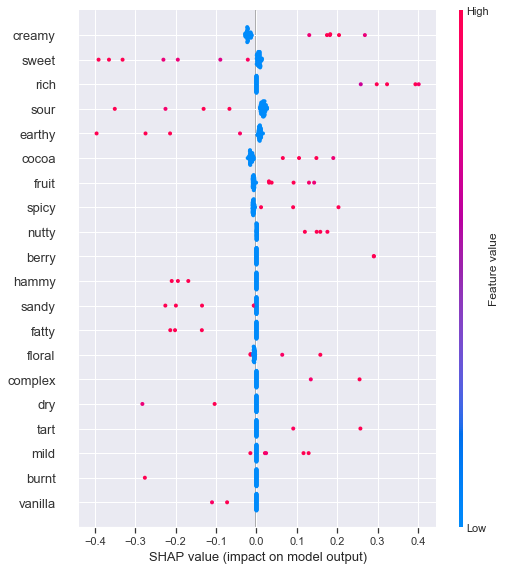

In [42]:
X_test_nlp_samp_df = pd.DataFrame(shap.sample(X_test_nlp_fit, 50).todense())
shap_lgb_explainer = shap.KernelExplainer(lgb_pipeline2.predict_proba,\
                            shap.kmeans(X_train_nlp_fit.todense(), 10))
shap_lgb_values_test = shap_lgb_explainer.shap_values(X_test_nlp_samp_df,\
                                            l1_reg="num_features(20)")
shap.summary_plot(shap_lgb_values_test, X_test_nlp_samp_df,\
            plot_type="dot", feature_names=vectorizer.get_feature_names())

In [43]:
print(shap.sample(X_test_nlp, 50).to_list()[18])

woody earthy medicinal


In [44]:
shap.force_plot(shap_lgb_explainer.expected_value, shap_lgb_values_test[18,:], 
                X_test_nlp_samp_df.iloc[18,:], feature_names=vectorizer.get_feature_names())

In [45]:
print(shap.sample(X_test_nlp, 50).to_list()[9])

intense spicy floral


In [46]:
shap.force_plot(shap_lgb_explainer.expected_value, shap_lgb_values_test[9,:], 
                X_test_nlp_samp_df.iloc[9,:], feature_names=vectorizer.get_feature_names())